In [7]:
# import
import glob
import numpy as np


import numpy as np
import pandas as pd
import sys
import seaborn as sns
from numpy import random

from matplotlib import pyplot as plt
import sys
import time
import math
from sklearn.preprocessing import StandardScaler
# import original_data
import optuna
import torch
from torch import nn, optim
from torch.nn import functional as F
from torch.optim.lr_scheduler import MultiStepLR
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import TensorDataset, random_split

# config
LEARNING_RATE = 0.0001
BATCH_SIZE = 16
EPOCHS = 1000
N_FRAME = 12
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [8]:
def get_migration_label(
    path:str
):
    """
    input: 
        temperature 

    return: 
        mig_label 
    """
    with open(path, 'r', encoding='utf-8') as fin:
        mig_label = []
        for i, line in enumerate(fin.readlines()[1:]):
            parts = line.strip().split()
            mig_label.append(bool(int(parts[1])))
        mig_label = np.array(mig_label)
    return mig_label

def get_original_data(
   path:str
):
    """
    input temperature : 温度
    
    return t, msd, csp, xyz, r_, v_xyz, v_, angle, g

    t       时间序列(单位:ps)
    msd     单He的msd(均方位移)
    csp     CSP(中心对称参数)
    xyz     单He的xyz坐标
    r_      单He离原点距离
    v_xyz   单He的沿xyz坐标的速度分量
    v_      单He的速度大小
    """
    with open(path, 'r', encoding='utf-8') as fin:
        t = []      # 时间序列(单位:ps)
        msd = []    # 单He的msd(均方位移)
        csp = []    # CSP(中心对称参数)
        xyz = []    # 单He的xyz坐标
        r_ = []     # 单He离原点距离
        v_xyz = []  # 单He的沿xyz坐标的速度分量
        v_ = []     # 单He的速度大小
        for i, line in enumerate(fin.readlines()[1:]):
            data = list(map(float, line.strip().split(' ')))
            t.append(data[0])
            msd.append(data[1])
            csp.append(data[2:8])
            xyz.append(data[8:11])
            r_.append(data[11])
            v_xyz.append(data[12:15])
            v_.append(data[15])

    # with open(G_PATH.format(Temperature=temperature), 'r', encoding='utf-8') as fin:
    #     g = []      # g参数
    #     for i, line in enumerate(fin.readlines()[1:]):
    #         data = list(map(float, line.strip().split(' ')))
    #         g.append(data[1:7])
    indices_to_remove = np.arange(1001, len(t) - 1, 1001)
    t = np.array(t)
    t = np.delete(t, indices_to_remove)
    t = t.reshape(-1, 1)
    msd = np.array(msd)
    msd = np.delete(msd, indices_to_remove)
    msd = msd.reshape(-1, 1)
    csp = np.array(csp)
    csp = np.delete(csp, indices_to_remove, axis=0)
    xyz = np.array(xyz)
    xyz = np.delete(xyz, indices_to_remove, axis=0)
    r_ = np.sqrt(np.array(r_))
    r_ = np.delete(r_, indices_to_remove)
    r_ = r_.reshape(-1, 1)
    v_xyz = np.array(v_xyz)
    v_xyz = np.delete(v_xyz, indices_to_remove, axis=0)
    v_ = np.sqrt(np.array(v_))
    v_ = np.delete(v_, indices_to_remove)
    v_ = v_.reshape(-1, 1)
    angle = np.arccos(v_xyz / v_.reshape(len(t), 1))
    # g = np.array(g)

    return t, msd, csp, xyz, r_, v_xyz, v_, angle# , g

In [9]:
data1 = get_original_data('./data/timedt.dataHe1.300')
data2 = get_original_data('./data/timedt.dataHe2.300')
data1 = np.hstack(data1)
data2 = np.hstack(data2)
data = np.hstack((data1,data2[:,1:]))

In [10]:
eda = pd.DataFrame(data)


# 画图的

In [14]:
import seaborn as sns

## MSD

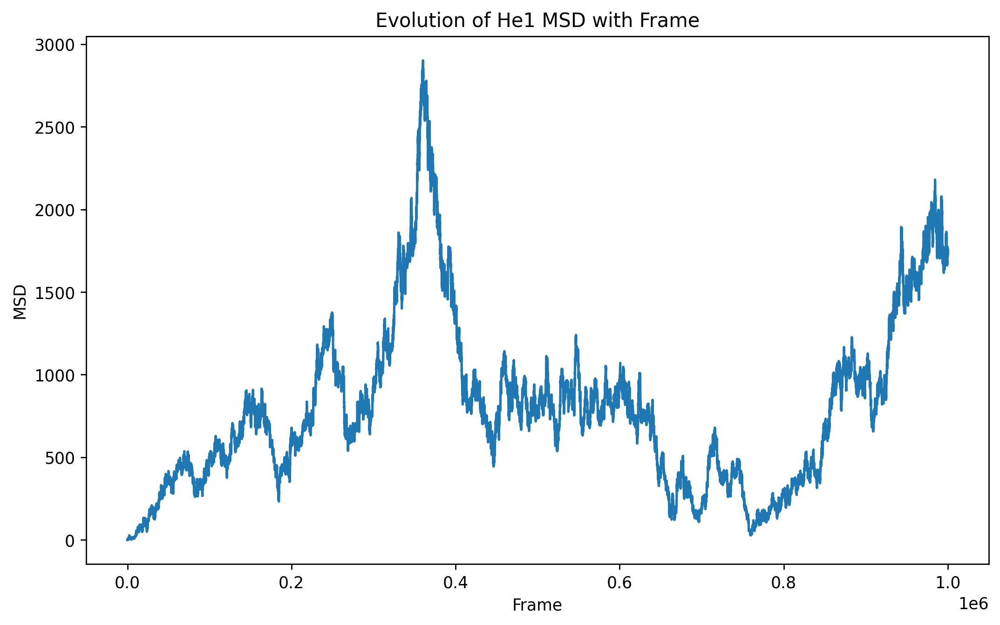

In [36]:
msd_he1 = eda[1] # HE1
# fig = plt.Figure(figsize=(10, 6), dpi=250)  
# # ax = fig.add_subplot(111)
# sns.lineplot(data=msd_he1)
# plt.xlabel('Frame')
# plt.ylabel('MSD')
# plt.title('"Evolution of He1 MSD with Frame')
# plt.savefig('./output/evolution of MSD He1.png')

fig, ax = plt.subplots(figsize=(10, 6), dpi=250)
sns.lineplot(data=msd_he1, ax=ax)
ax.set_xlabel('Frame')
ax.set_ylabel('MSD')
ax.set_title('Evolution of He1 MSD with Frame')
plt.savefig('./output/evolution_of_MSD_He1.png')
plt.show()

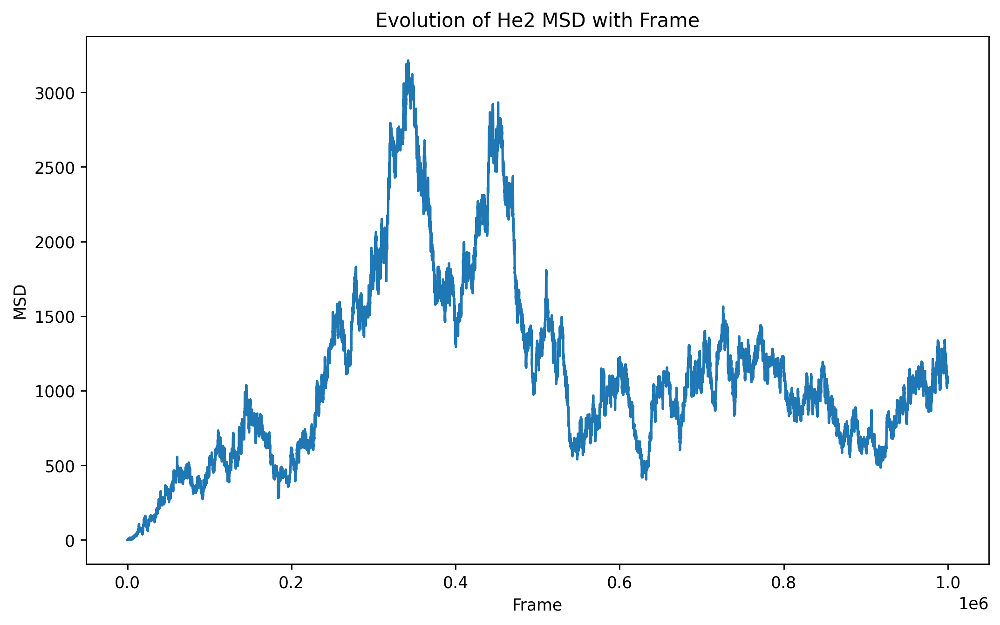

In [37]:
msd_he2 = eda[19] # He2 
# fig = plt.Figure(figsize=(10, 6), dpi=250)  
# # ax = fig.add_subplot(111)
# sns.lineplot(data=msd_he2)
# plt.xlabel('Frame')
# plt.ylabel('MSD')
# plt.title('"Evolution of He2 MSD with Frame')
# plt.savefig('./output/evolution of MSD He2.png')
fig, ax = plt.subplots(figsize=(10, 6), dpi=250)
sns.lineplot(data=msd_he2, ax=ax)
ax.set_xlabel('Frame')
ax.set_ylabel('MSD')
ax.set_title('Evolution of He2 MSD with Frame')
plt.savefig('./output/evolution_of_MSD_He2.png')
plt.show()

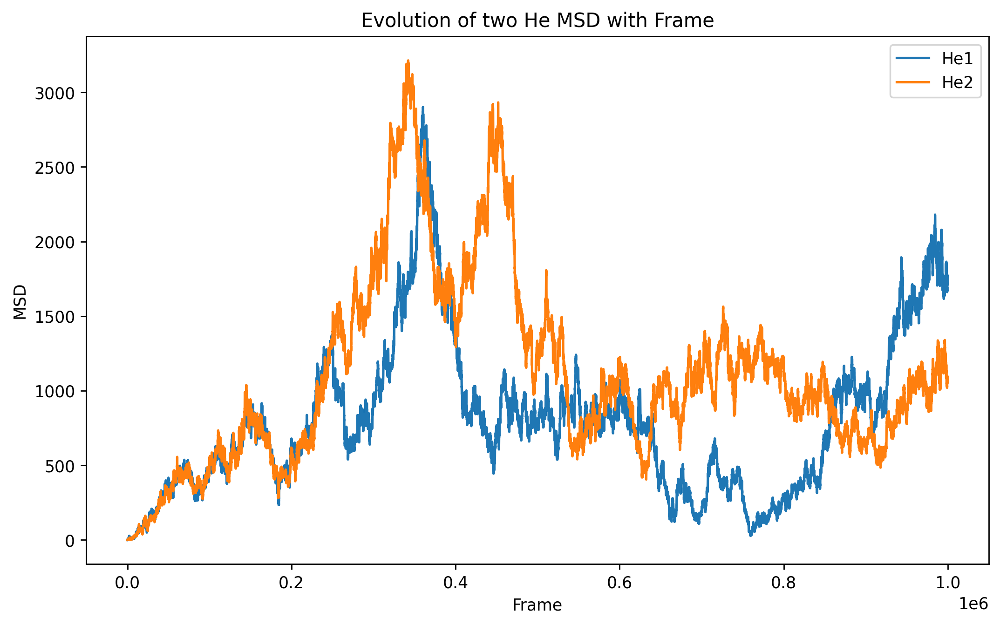

In [40]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=250)
sns.lineplot(data=msd_he1, label='He1')
sns.lineplot(data=msd_he2, label='He2')

ax.set_xlabel('Frame')
ax.set_ylabel('MSD')
ax.set_title('Evolution of two He MSD with Frame')
ax.legend()
plt.savefig('./output/evolution_of_MSD_two_he.png')
plt.show()

# 检验是不是跟时间有关

In [50]:
import statsmodels.api as sm
time = eda[0]
time = sm.add_constant(time)
model = sm.OLS(eda[1], time)
results = model.fit()
print(results.summary())

model = sm.OLS(eda[19], time)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      1   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                 2.951e+04
Date:                Wed, 01 May 2024   Prob (F-statistic):               0.00
Time:                        16:19:06   Log-Likelihood:            -7.6490e+06
No. Observations:             1000001   AIC:                         1.530e+07
Df Residuals:                  999999   BIC:                         1.530e+07
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        650.4699      1.023    635.756      0.0

可以认为没有相关性

* 不如试试adf

In [11]:
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    # print('Results of Augmented Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)' % key] = value
    # print(dfoutput)
    return dfoutput

adf_list = []
for feature in eda.columns[1:]:
    # 由于代价问题，只能抽样，不然内存要爆
    sampled_series = eda[feature][::100]
    adf_list.append(adf_test(sampled_series))
    # print(1)
adf_df = pd.concat(adf_list, axis=1)   
adf_df = adf_df.T
del adf_df['Number of Observations Used']
# adf_df
# adf_df.to_csv(f'./output/adf_test.csv', mode='a')

# 分布分析

一部分分布分析已经写在上面了，下面分析其他的。

## CSP的

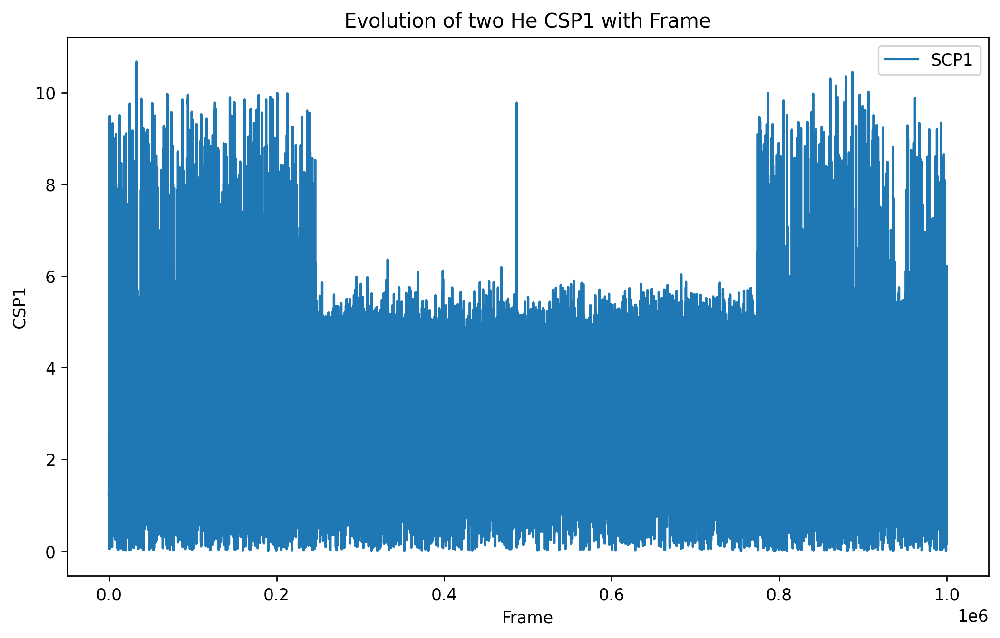

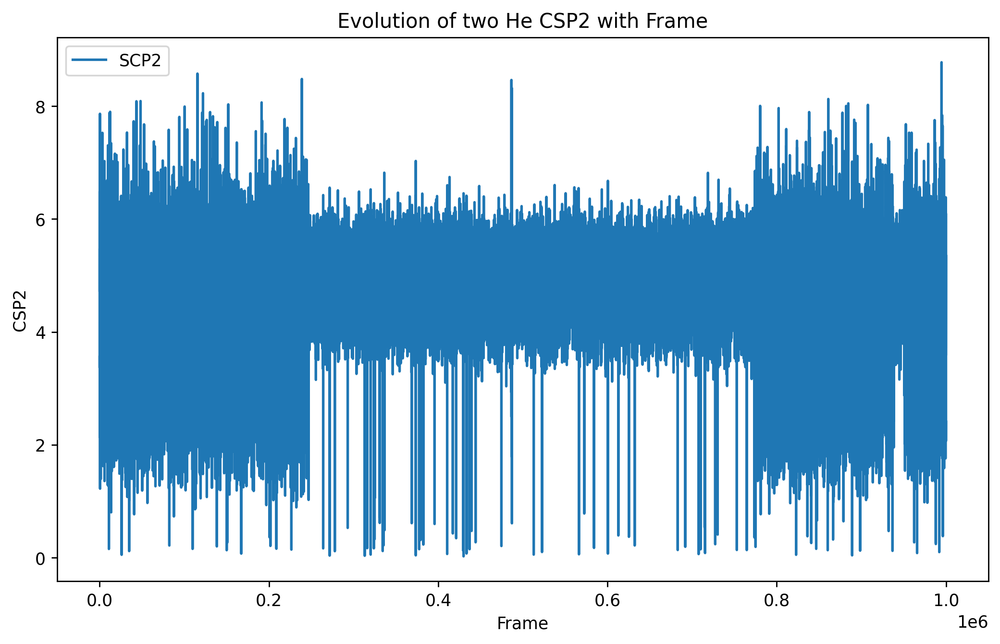

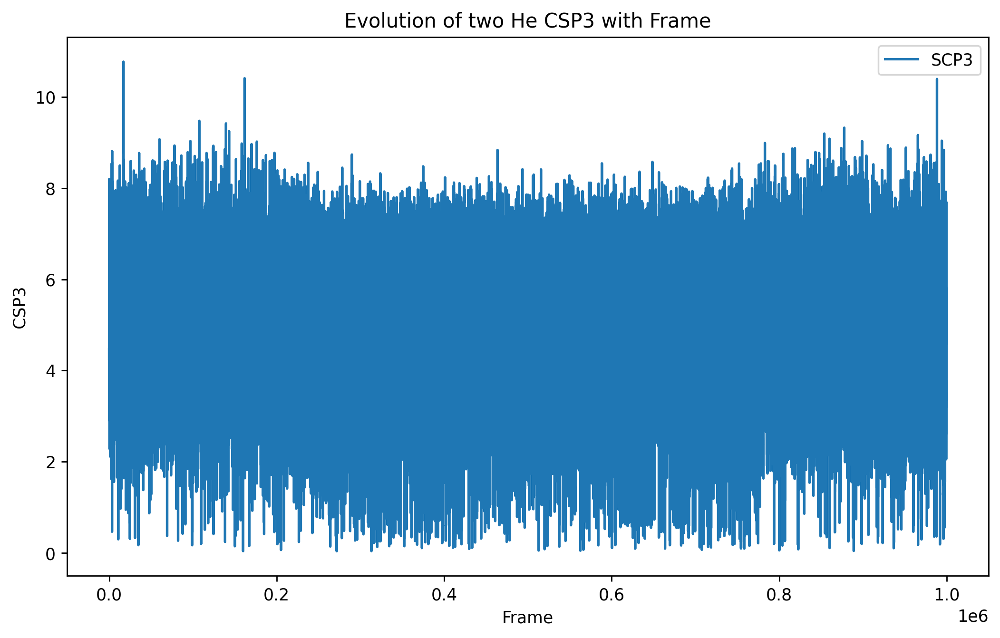

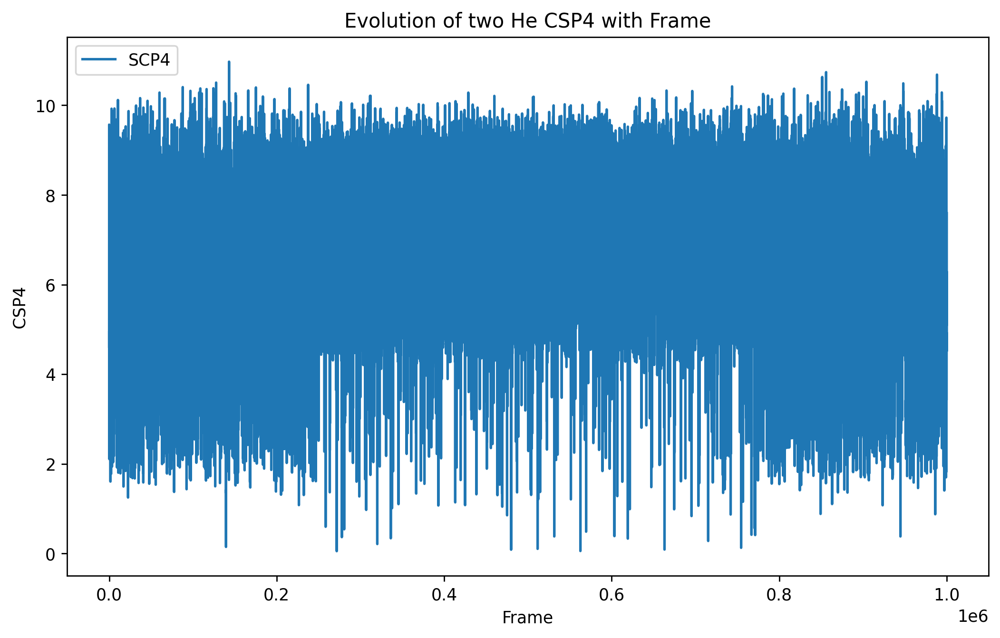

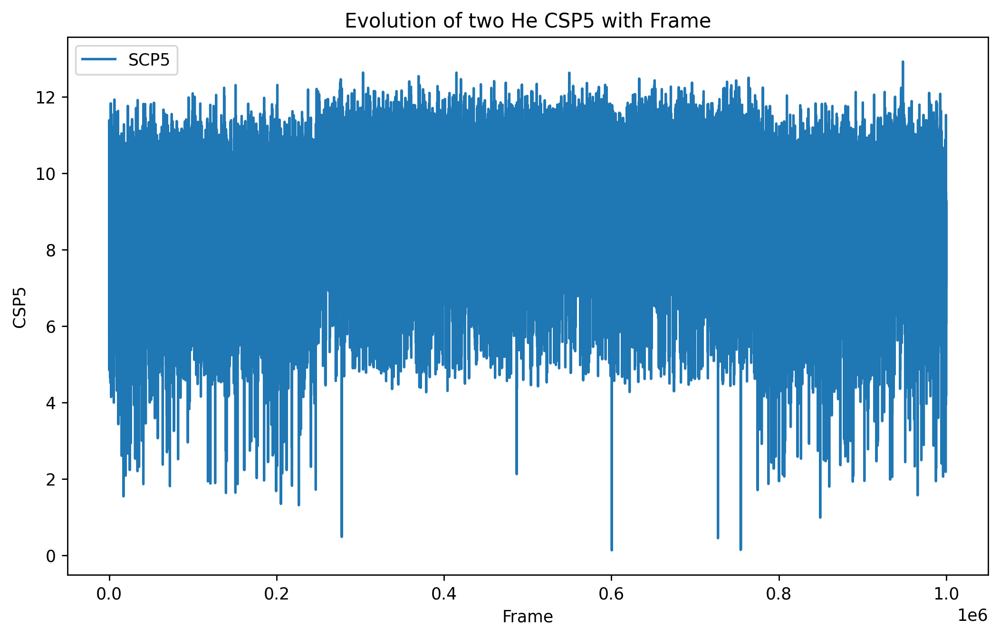

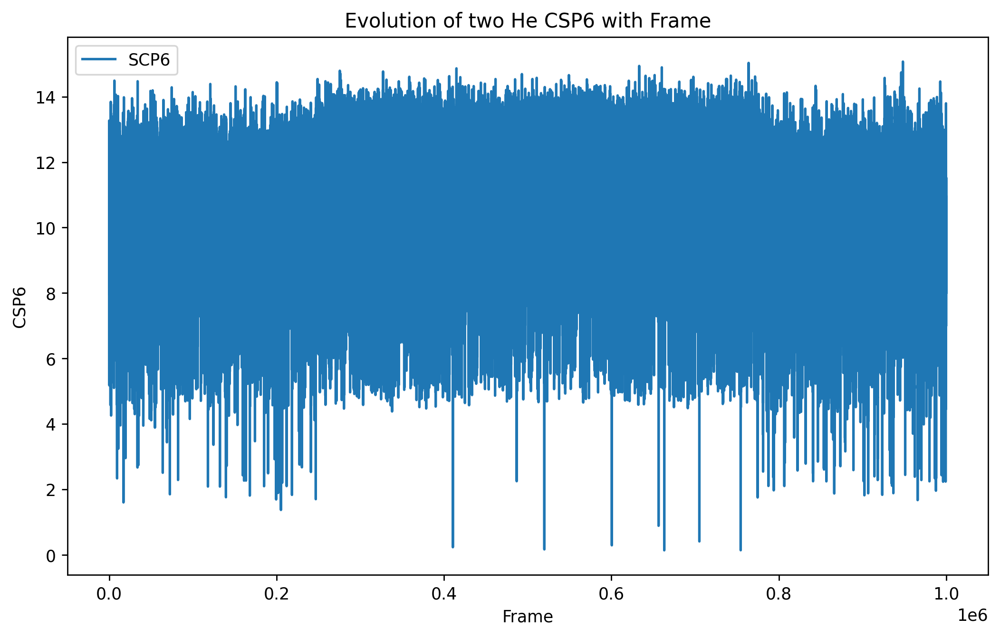

In [19]:
for i in range(2,8):
    fig, ax = plt.subplots(figsize=(10, 6), dpi=250)
    sns.lineplot(data=eda[i], label=f'SCP{i-1}')
    ax.set_xlabel('Frame')
    ax.set_ylabel(f'CSP{i-1}')
    ax.set_title(f'Evolution of two He CSP{i-1} with Frame')
    ax.legend()
    plt.savefig(f'./output/evolution_of_CSP{i}_two_he.png')
    plt.show()

## R

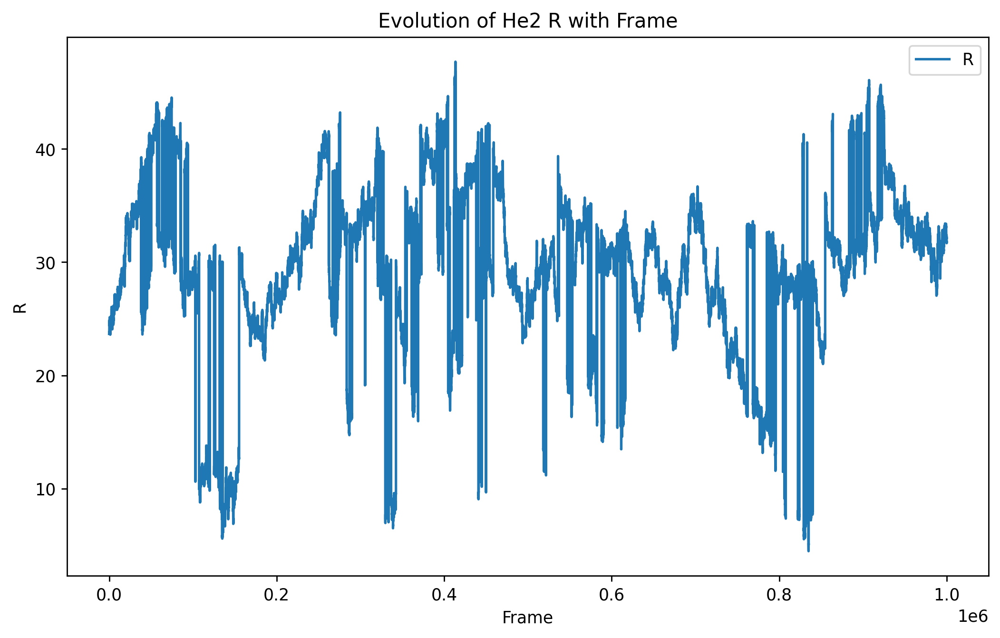

In [30]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=250)
sns.lineplot(data=eda[29], label=f'R')
ax.set_xlabel('Frame')
ax.set_ylabel(f'R')
ax.set_title(f'Evolution of He2 R with Frame')
ax.legend()
plt.savefig(f'./output/evolution_of_R_he2.png')
plt.show()

## V

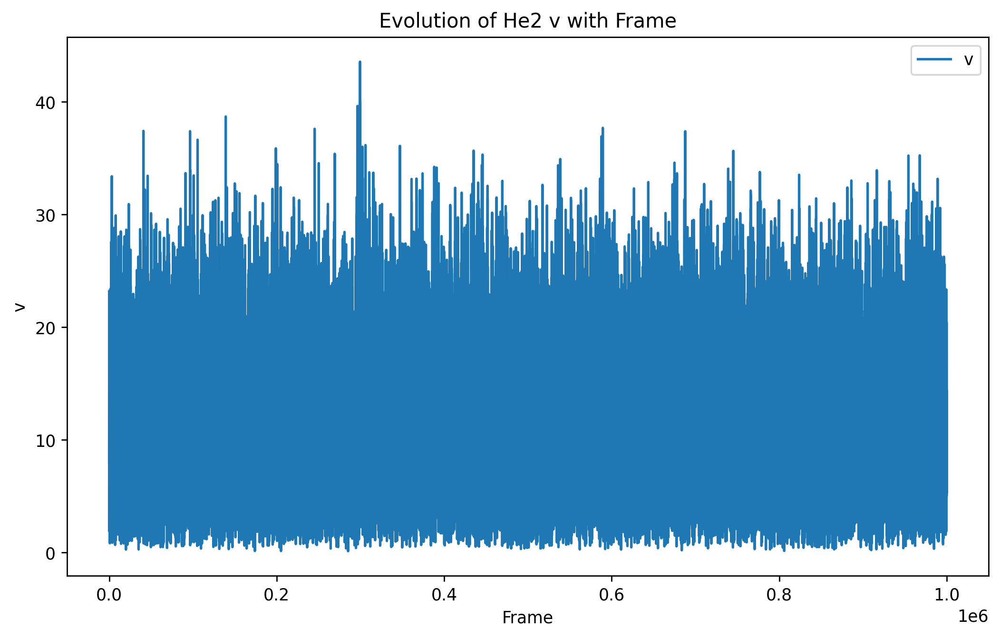

In [32]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=250)
sns.lineplot(data=eda[33], label=f'v')
ax.set_xlabel('Frame')
ax.set_ylabel(f'v')
ax.set_title(f'Evolution of He2 v with Frame')
ax.legend()
plt.savefig(f'./output/evolution_of_v_he2.png')
plt.show()

# 相关性分析

In [34]:
eda_mini = eda[::100]

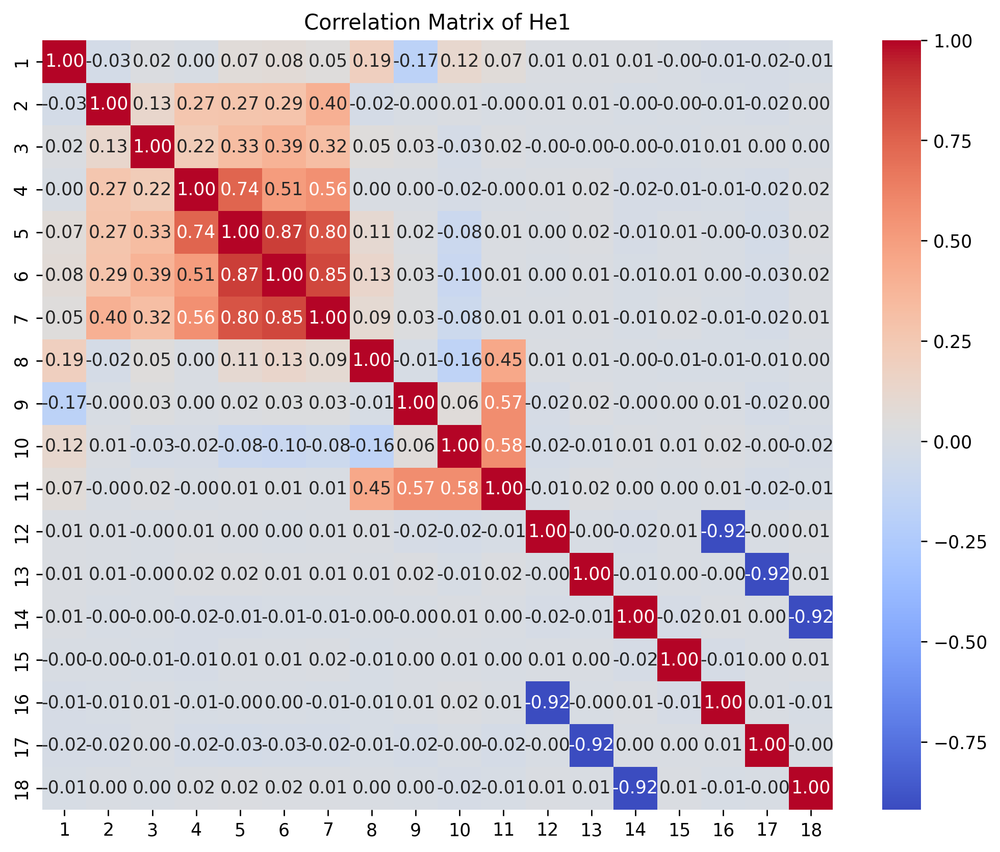

In [39]:
correlation_matrix = eda_mini[eda_mini.columns[1:19]].corr()
plt.figure(figsize=(10, 8), dpi=250)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of He1")
plt.savefig('./output/CM of He1.png')

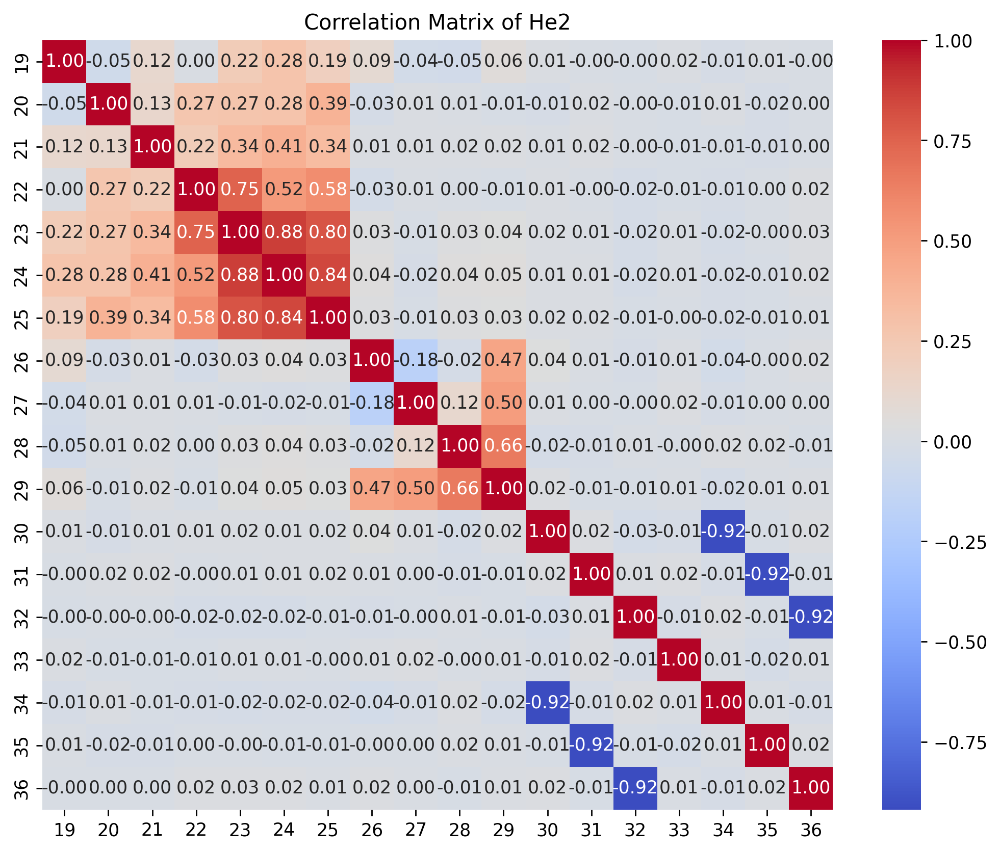

In [40]:
correlation_matrix = eda_mini[eda_mini.columns[19:]].corr()
plt.figure(figsize=(10, 8), dpi=250)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of He2")
plt.savefig('./output/CM of He2.png')

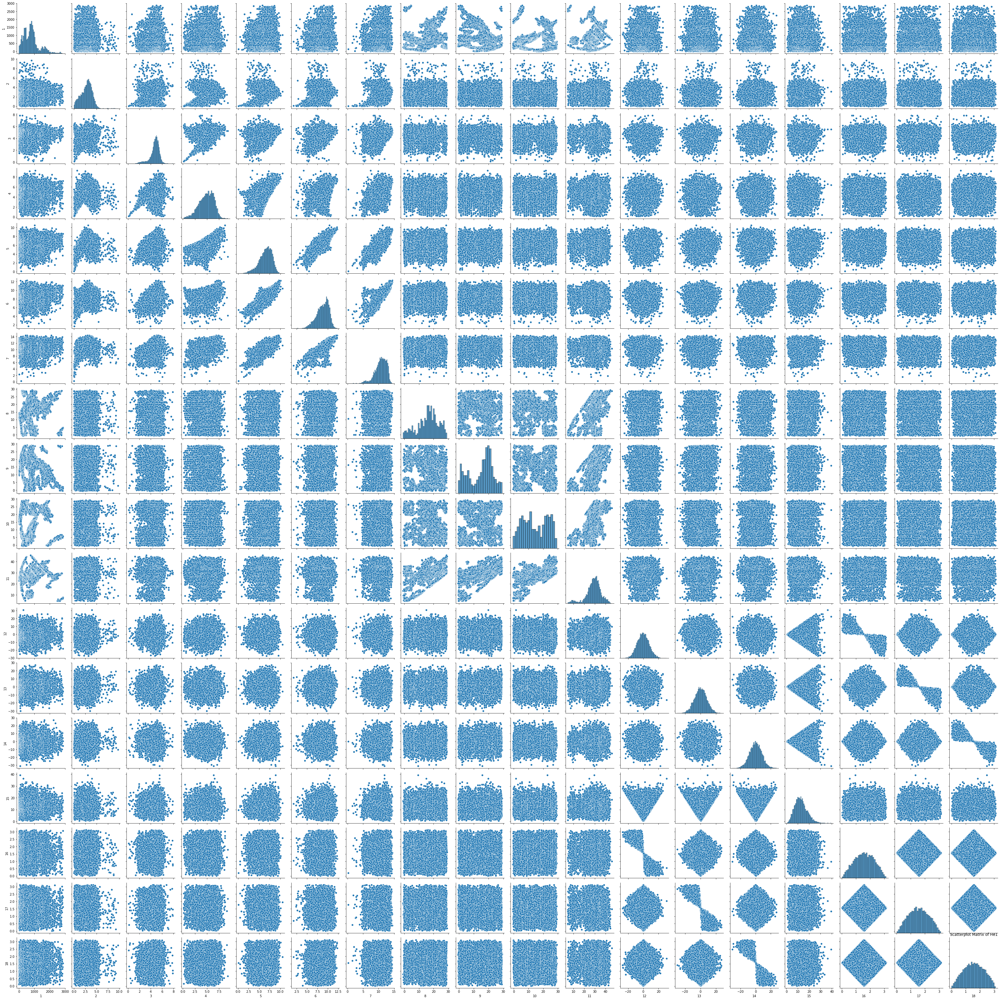

In [43]:
sns.pairplot(eda_mini[eda_mini.columns[1:19]])
plt.title("Scatterplot Matrix of He1")
plt.savefig('./output/SM of He1.png')
plt.show()

* 找出最相关特征，分析He1与He2之间的相关性

In [11]:
from sklearn.decomposition import PCA
he1 = eda[eda.columns[1:19]]
he2 = eda[eda.columns[19:]]

In [12]:
pca_1 = PCA(n_components=1).fit_transform(he1)
pca_2 = PCA(n_components=1).fit_transform(he2)

In [21]:
data

,pca_results,timestamps
0,-803.070656,-1106.134507
1,-803.070668,-1106.134237
2,-803.070544,-1106.133812
3,-803.070304,-1106.133221
4,-803.069961,-1106.132447
...,...,...
999996,942.370525,-11.631463
999997,942.983205,-11.815034
999998,943.639045,-12.054604
999999,944.336494,-12.352290


Text(0.5, 1.0, 'Scatter plot of the main characteristics')

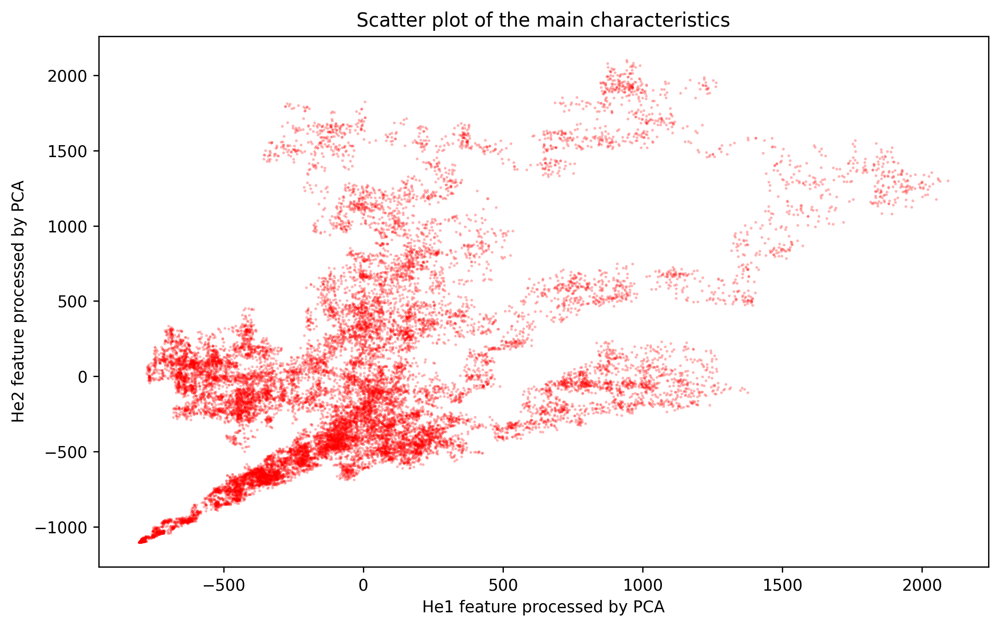

In [48]:
import matplotlib.pyplot as plt

x = pca_1[::50,0].ravel()
y = pca_2[::50,0].ravel()
fig = plt.figure(figsize=(10, 6), dpi=250)
plt.scatter(x, y, s=0.5, facecolors='none', edgecolors=(1, 0, 0, 0.3), linestyles='--')
# plt.show()
plt.xlabel('He1 feature processed by PCA')
plt.ylabel('He2 feature processed by PCA')
plt.title('Scatter plot of the main characteristics')


In [55]:
from scipy.stats import kendalltau
from scipy.stats import spearmanr
correlation, p_value = spearmanr(pca_1, pca_2)
# correlation, p_value = kendalltau(pca_1, pca_2)

In [56]:
correlation, p_value

(0.4153822579429393, 0.0)

# 解释性分析

In [1]:
import pandas as pd
df = pd.read_csv('adf_test.csv')

In [3]:
df = df.round(4)

In [5]:
df = df[df.columns[1:]]

In [6]:
df

,Test Statistic,p-value,#Lags Used,Critical Value (1%),Critical Value (5%),Critical Value (10%)
0,-2.0860,0.2502,7.0,-3.431,-2.8618,-2.5669
1,-42.2863,0.0000,4.0,-3.431,-2.8618,-2.5669
2,-10.6133,0.0000,35.0,-3.431,-2.8618,-2.5669
3,-47.3602,0.0000,3.0,-3.431,-2.8618,-2.5669
4,-6.7384,0.0000,35.0,-3.431,-2.8618,-2.5669
5,-5.3562,0.0000,35.0,-3.431,-2.8618,-2.5669
6,-7.6266,0.0000,35.0,-3.431,-2.8618,-2.5669
7,-6.4180,0.0000,36.0,-3.431,-2.8618,-2.5669
8,-6.2808,0.0000,38.0,-3.431,-2.8618,-2.5669
9,-5.1791,0.0000,36.0,-3.431,-2.8618,-2.5669


In [50]:
import numpy as np

# 加载.npy文件
array1 = np.load('MigFace_400.npy', allow_pickle=True)
array2 = np.load('MigFaceLabel_400_16.npy', allow_pickle=True)
array3 = np.load('MigIndex_400.npy', allow_pickle=True)


# 查看数组内容
print("Array 1:")
print(array1)

print("Array 2:")
print(array2)

print("Array 3:")
print(array3)


Array 1:
[{1110: array([12.8603, 15.558 , 15.8629]), 1130: array([12.8701, 18.7006, 15.7674]), 1131: array([14.432 , 17.2312, 14.2298])}
 {1110: array([12.8419, 15.7114, 15.9199]), 1129: array([11.1757, 17.2182, 14.1281]), 1130: array([12.7698, 18.6356, 15.8989])}
 {1110: array([12.8628, 15.4905, 15.7567]), 1129: array([11.3305, 17.2299, 14.2118]), 1130: array([12.6979, 18.738 , 15.7853])}
 ...
 {1446: array([ 7.2869 ,  7.11419, 21.4914 ]), 1465: array([ 5.74259,  8.60328, 19.7321 ]), 1665: array([ 5.66461,  8.56599, 23.1436 ])}
 {1465: array([ 5.7546 ,  8.50723, 19.8011 ]), 1466: array([ 7.22933, 10.2822 , 21.3922 ]), 1665: array([ 5.64573,  8.52126, 23.2227 ])}
 {1465: array([ 5.68969,  8.52233, 19.6846 ]), 1466: array([ 7.1428, 10.1145, 21.2971]), 1665: array([ 5.69387,  8.59198, 22.8997 ])}]
Array 2:
[[   464    516      0]
 [   516    565      1]
 [   565    657      1]
 ...
 [999349 999415      1]
 [999415 999514      3]
 [999514 999559      1]]
Array 3:
[   307    464    516 ...

In [59]:
array1.shape

(9047,)

In [ ]:
class CNN(nn.Module):
    def __init__(
        self, 
        Channel_in, 
        Height_in, 
        Width_in,
        Embedding_list,
        Output_size, 
        Filter_num, 
        Kernel_list, 
        dropout = 0.5, 
    ):
        super(CNN, self).__init__()
        self.Embedding_list = Embedding_list
        self.emb = nn.ModuleList([
            nn.Sequential( nn.Linear(emb, Width_in),)
         for emb in Embedding_list])
        
        self.convs = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(
                    Channel_in, 
                    Filter_num, 
                    kernel_size=(kernel, Width_in), 
                    padding=((kernel - 1) // 2, 0), 
                ),
                nn.ReLU(),
                nn.MaxPool2d(
                    kernel_size=((Height_in+3)//4, 1), 
                    stride=(Height_in+3)//4, 
                    padding=((Height_in-Height_in//4*4+1)//2, 0), 
                ), 
            )
            for kernel in Kernel_list
        ])
        # print(Kernel_list)
        self.fc = nn.Sequential(
            nn.Dropout(dropout), 
            nn.Linear(Filter_num * len(Kernel_list) * 4, 64),
            nn.ReLU(), 
            nn.Linear(64, 16), 
            nn.Linear(16, Output_size)
        )
        # one -hot 时就这样就行 output_size=4
        # self.output = nn.Sigmoid()

    def forward(self, x):
        x_list = []
        temp = 0
        for emb in self.Embedding_list:
            x_list.append(x[:,:,:,temp:temp+emb])
            temp = temp+emb
        embx = []
        for i, emb in enumerate(self.emb):
            embx.append(emb(x_list[i]))
        x = sum(tensor for tensor in embx)
        out = [conv(x) for conv in self.convs]
        out = torch.cat(out, dim=1)
        out = out.view(x.size(0), -1)
        # print(out.shape)
        out = self.fc(out)
        # output = self.output(out)
        return out
    
    

In [2]:
import fitz  # pymupdf 的模块

# 打开目标 PDF 文件
pdf_document = fitz.open("USTCThesis__LaTeX_template_for_USTC_thesis-4.pdf")
pdf_document.delete_page(0)
# pdf_document.delete_page(1)

# 打开要插入的页面 PDF 文件
page_to_insert_doc = fitz.open("大学生创新训练计划结题报告封面.pdf")
page_to_insert = page_to_insert_doc.load_page(0)

# 获取要插入页面的尺寸
page_rect = page_to_insert.rect

# 插入空白页到目标 PDF
new_page_index = 0  # 这里指定插入位置
pdf_document.insert_page(new_page_index, width=page_rect.width, height=page_rect.height)

# 获取刚插入的空白
new_page = pdf_document.load_page(new_page_index)

# 将待插入页面的内容显示到新的空白页上
new_page.show_pdf_page(page_rect, page_to_insert_doc, 0)

# 保存修改后的 PDF 文档
pdf_document.save("modified_pdf_file.pdf")
pdf_document.close()

# 关闭插入页面 PDF 文件
page_to_insert_doc.close()


$\sqrt{1+x}$